# Flowers classification using CNN.

# Table of Contents
1. [Importing necessary libraries;](#section-one)
2. [Loading the data.](#section-two)
3. [Data visualization](#section-three)
4. [Data Pre_processing and train_test splitting;](#section-four)
5. [Data Augmentation](#section-five)
6. [Applying model(CNN);](#section-six)
7. [Evaluating model;](#section-seven)                     

# Let's dive into flowers valley carrying CNN...
<img src='https://cdn.pixabay.com/photo/2016/04/16/12/50/chrysanthemum-1332994_1280.jpg'>
</img>
<figcaption style="text-align: center;">
    <strong>
        Photo by 
        <a href='https://pixabay.com/users/gam-ol-2829280/?utm_source=link-attribution&utm_medium=referral&utm_campaign=image&utm_content=3319946'>...</a>
        on 
        <a href='https://pixabay.com/?utm_source=link-attribution&utm_medium=referral&utm_campaign=image&utm_content=3319946'>Pixabay</a>
    </strong>
</figcaption>

<a id="section-one"></a>
# 1-Importing necessary libraries;

In [4]:
# importing libraries
import os  # Operating system module for interacting with the file system
import cv2  # OpenCV module for image processing
import numpy as np  # NumPy module for numerical operations
import matplotlib.pyplot as plt  # Matplotlib module for data visualization
from sklearn.model_selection import train_test_split  # Function for splitting data into training and testing sets
import tensorflow as tf  # TensorFlow module for deep learning
from keras.utils import to_categorical  # Function for one-hot encoding of labels
from keras.preprocessing.image import ImageDataGenerator  # Class for data augmentation of images
from keras.optimizers import Adam  # Optimizer for model training
from sklearn.metrics import confusion_matrix  # Function for evaluating model performance using confusion matrix
from sklearn.utils.multiclass import unique_labels  # Function for generating unique class labels

<a id="section-two"></a>
# 2-Loading the data.

In [31]:
# Specifying the path to the dataset folder
flowers = "flowers"
images=[]
labels=[]

**Now we wil load, resize, and normalize images,  and  also we will extract corresponding labels of the images.**

In [32]:
# Iterate through the subfolders in the dataset folder
for subfolder in os.listdir(flowers):
    subfolder_path = os.path.join(flowers, subfolder)
    if os.path.isdir(subfolder_path):
        # Get the label from the subfolder name
        label = subfolder

        # Iterate through the image files in the subfolder
        for image_file in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_file)

            # Read the image using OpenCV
            image = cv2.imread(image_path)

            # Perform any necessary preprocessing on the image
            
            # Resize the image to a fixed size (e.g., 64x64)
            image = cv2.resize(image, (150, 150))
            
            # Normalize pixel values to the range of 0 to 1
            image = image.astype('float32') / 255.0

            # Append the image and label to the lists
            images.append(image)
            labels.append(label)

# Convert the lists to NumPy arrays
images = np.array(images)
labels = np.array(labels)


<a id="section-three"></a>
# 3-Data visualization

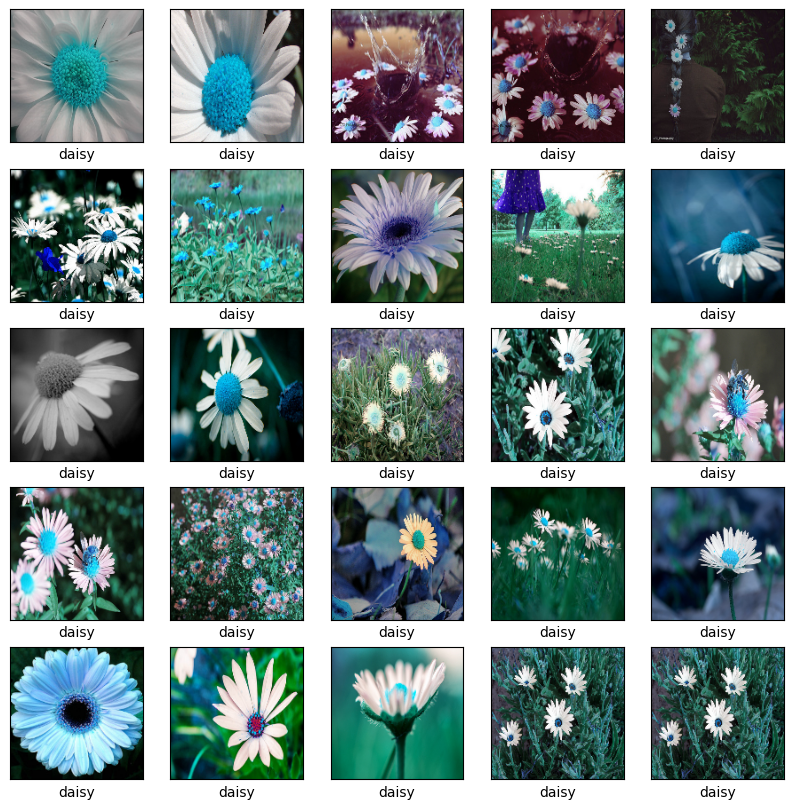

In [38]:
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i], cmap=plt.cm.binary)
    plt.xlabel(labels[i])
plt.show()

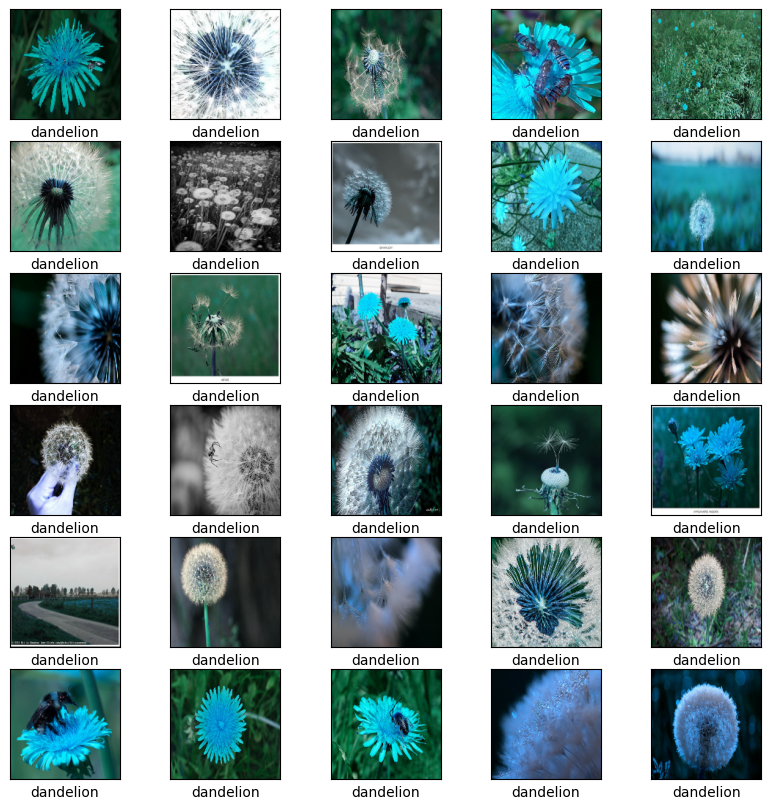

In [40]:
plt.figure(figsize=(10, 10))
for i in range(1001, 1031):
    plt.subplot(6, 5, i-1000)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i], cmap=plt.cm.binary)
    plt.xlabel(labels[i])
plt.show()

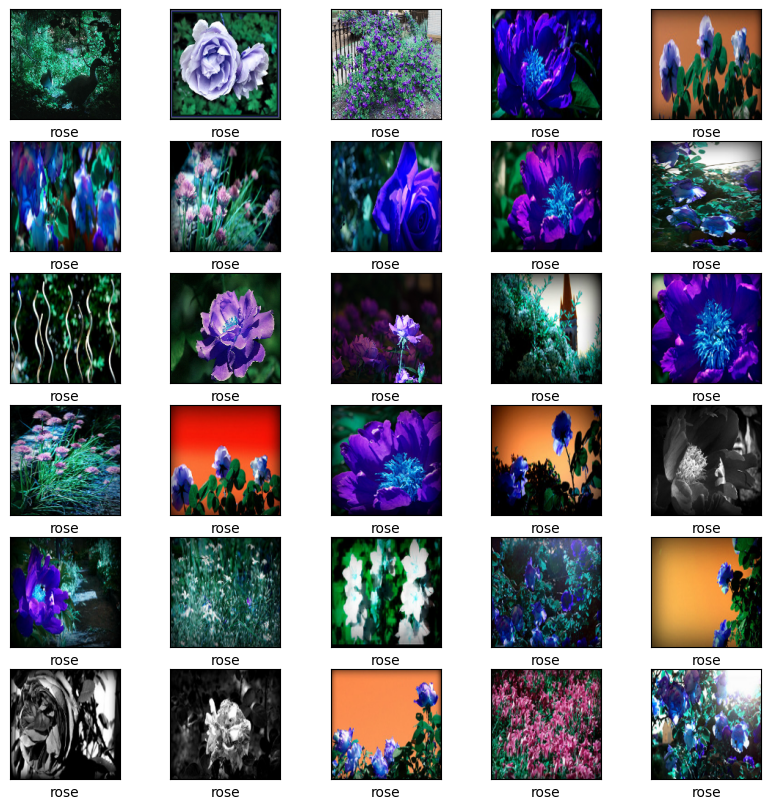

In [41]:
plt.figure(figsize=(10, 10))
for i in range(2001, 2031):
    plt.subplot(6, 5, i-2000)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i], cmap=plt.cm.binary)
    plt.xlabel(labels[i])
plt.show()

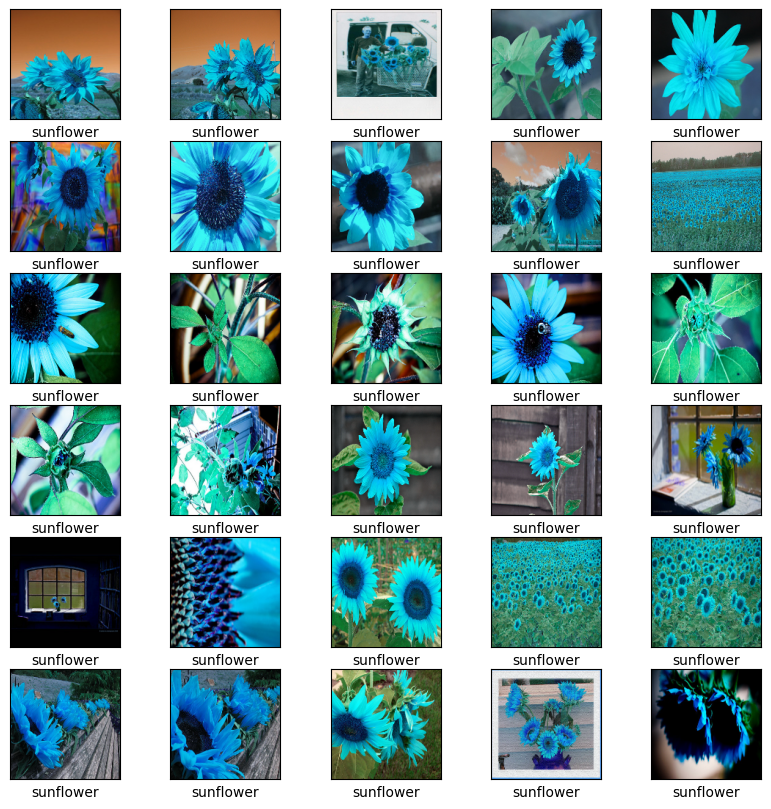

In [42]:
plt.figure(figsize=(10, 10))
for i in range(3001, 3031):
    plt.subplot(6, 5, i-3000)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i], cmap=plt.cm.binary)
    plt.xlabel(labels[i])
plt.show()

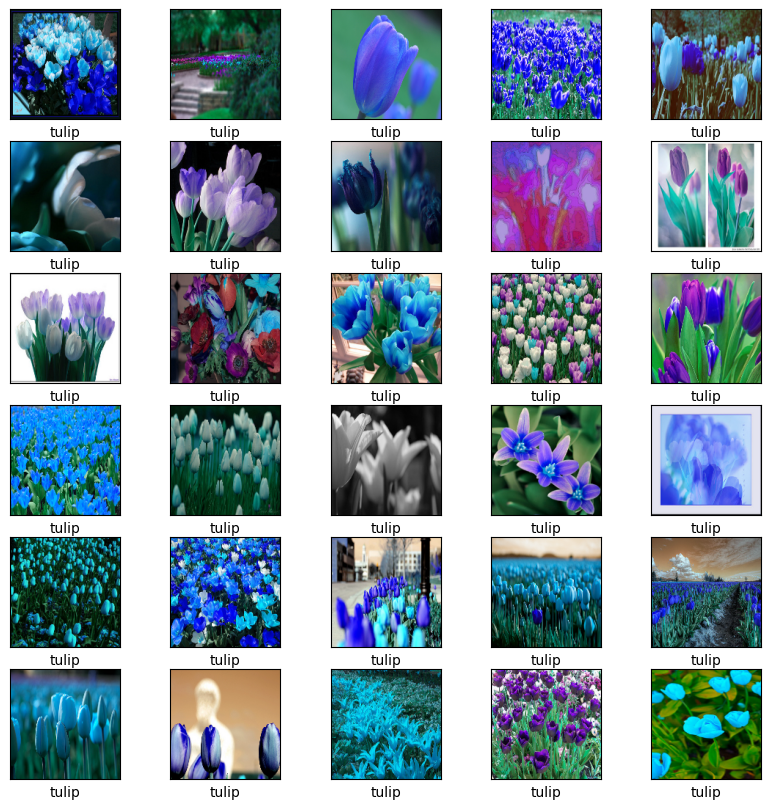

In [43]:
plt.figure(figsize=(10, 10))
for i in range(4001, 4031):
    plt.subplot(6, 5, i-4000)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i], cmap=plt.cm.binary)
    plt.xlabel(labels[i])
plt.show()

<a id="section-four"></a>
# 4-Data Pre_processing and train_test splitting;

**Now we will convert categorical labels into a numerical format and  will transform them into a suitable representation for training models because they expect one-hot encoded labels.**

In [10]:
# Convert labels to integers
label_to_index = {label: i for i, label in enumerate(np.unique(labels))}
labels = np.array([label_to_index[label] for label in labels])

# Perform one-hot encoding on the labels
num_classes = len(np.unique(labels))
labels = to_categorical(labels, num_classes=num_classes)

In [11]:
print(images.shape)
print(labels.shape)

(4317, 150, 150, 3)

(4317, 5)


**Now we will split the data into training and testing datasets.**

In [12]:
# Split the data into training and testing sets

train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, random_state=42)

# Print the shape of the arrays to verify the loading process
print("Train Images shape:", train_images.shape)
print("Train Labels shape:", train_labels.shape)
print("Test Images shape:", test_images.shape)
print("Test Labels shape:", test_labels.shape)

Train Images shape: (3453, 150, 150, 3)

Train Labels shape: (3453, 5)

Test Images shape: (864, 150, 150, 3)

Test Labels shape: (864, 5)


c:\ProgramData\miniconda3\envs\deepLearning_env\Lib\site-packages\matplotlib\text.py:1279: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

  if s != self._text:


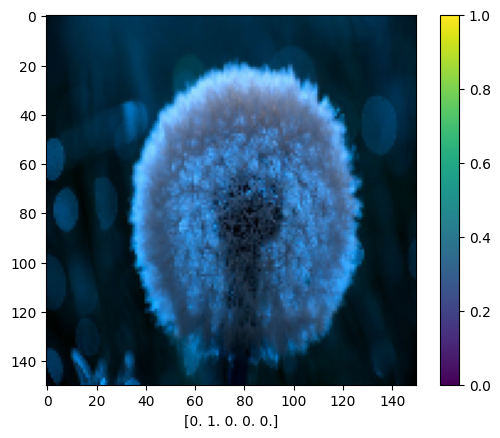

In [13]:
plt.imshow(train_images[101])
plt.xlabel(train_labels[101])
plt.colorbar()


<a id="section-five"></a>
# 5-Data Augmentation

**Now we will perform data augmentation technique for better performance.Data augmentation increase the diversity and variability of the training data, allowing the model to learn from a wider range of examples and generalize better to unseen data.**

In [14]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

<a id="section-six"></a>
# 6-Applying model(CNN);

In [15]:
model=tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(150, 150,3)),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation="relu"),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation="relu"),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation="relu"),
    tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dense(5, activation="softmax")
])

In [16]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 148, 148, 32)      896       

                                                                 

 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         

 )                                                               

                                                                 

 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     

                                                                 

 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         

 2D)                                                             

                                                                 

 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     

                                                                 

 max_pooling2d_2 (MaxPooling  (None, 17,

In [17]:
# Train the model
batch_size = 32
epochs = 20

history = model.fit(
    datagen.flow(train_images, train_labels, batch_size=batch_size),
    steps_per_epoch=len(train_images) // batch_size,
    epochs=epochs,
    validation_data=(test_images, test_labels))

Epoch 1/20

107/107 [==============================] - 219s 2s/step - loss: 1.3269 - accuracy: 0.4502 - val_loss: 1.1134 - val_accuracy: 0.5417

Epoch 2/20

107/107 [==============================] - 209s 2s/step - loss: 1.0394 - accuracy: 0.5987 - val_loss: 0.9501 - val_accuracy: 0.6273

Epoch 3/20

107/107 [==============================] - 207s 2s/step - loss: 0.9482 - accuracy: 0.6200 - val_loss: 0.9752 - val_accuracy: 0.6169

Epoch 4/20

107/107 [==============================] - 200s 2s/step - loss: 0.8978 - accuracy: 0.6486 - val_loss: 0.8858 - val_accuracy: 0.6725

Epoch 5/20

107/107 [==============================] - 200s 2s/step - loss: 0.8415 - accuracy: 0.6714 - val_loss: 0.8903 - val_accuracy: 0.6806

Epoch 6/20

107/107 [==============================] - 199s 2s/step - loss: 0.8135 - accuracy: 0.6796 - val_loss: 0.7959 - val_accuracy: 0.6910

Epoch 7/20

107/107 [==============================] - 198s 2s/step - loss: 0.7669 - accuracy: 0.7027 - val_loss: 0.7824 - val_acc

<a id="section-seven"></a>
# 7-Evaluating model;

27/27 [==============================] - 17s 603ms/step - loss: 0.7050 - accuracy: 0.7616

test_loss:, [0.7050228118896484, 0.7615740895271301]


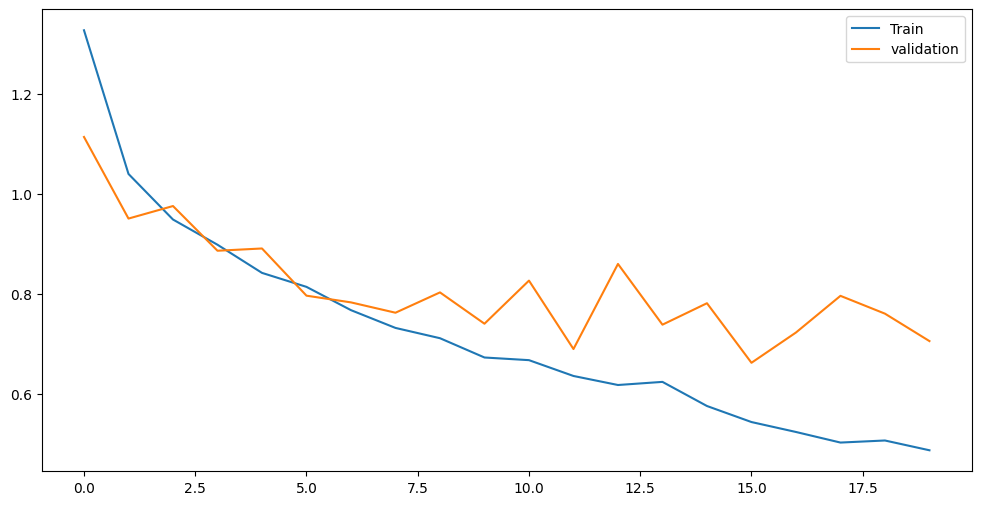

In [18]:
plt.figure(figsize=(12, 6))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["Train", "validation"], loc="upper right")

loss=model.evaluate(test_images, test_labels)
print(f"test_loss:, {loss}")


In [19]:
test_loss, test_acc= model.evaluate(test_images, test_labels, verbose=2)
print("\nTest loss=", test_loss)
print("\nTest accuracy=", test_acc)

27/27 - 16s - loss: 0.7050 - accuracy: 0.7616 - 16s/epoch - 582ms/step



Test loss= 0.7050228118896484



Test accuracy= 0.7615740895271301


**So we've got an accuracy of `76%`.**

In [20]:
predictions=model.predict(test_images)

27/27 [==============================] - 15s 559ms/step


In [24]:
test_labels[100]

array([1., 0., 0., 0., 0.], dtype=float32)

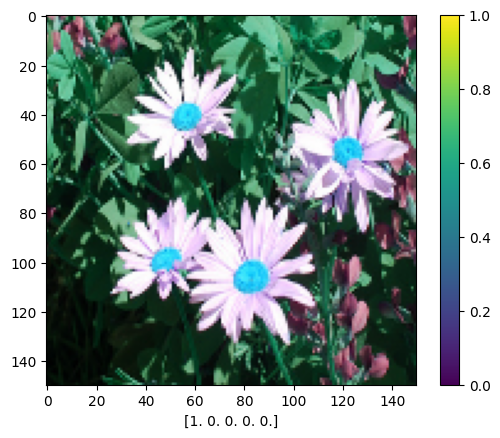

In [25]:
plt.imshow(test_images[100])
plt.xlabel(test_labels[100])
plt.colorbar()

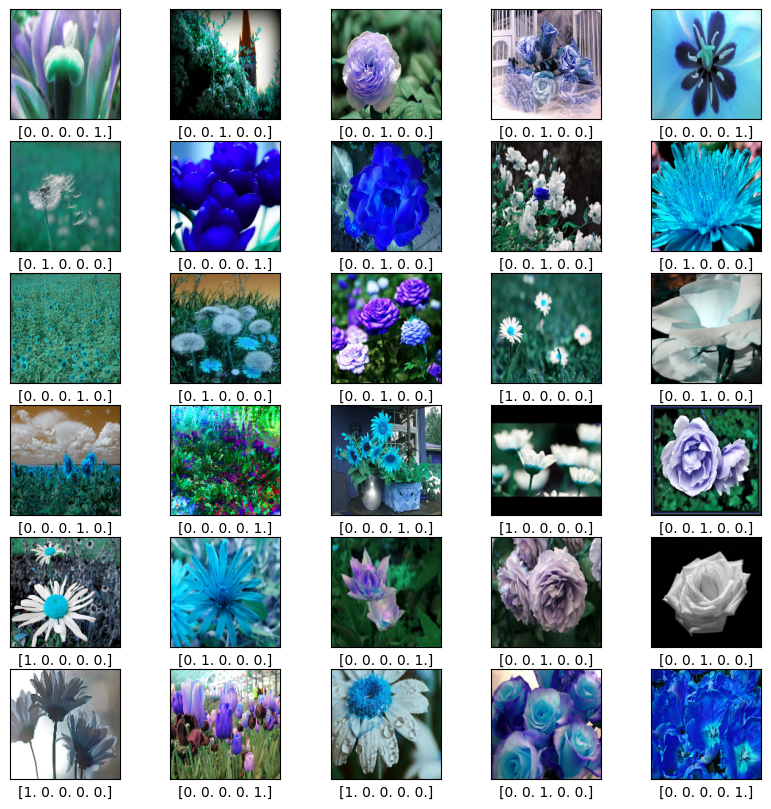

In [23]:
plt.figure(figsize=(10, 10))
for i in range(30):
    plt.subplot(6, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[i], cmap=plt.cm.binary)
    plt.xlabel(test_labels[i])
plt.show()

In [66]:
predictions[0]

array([0.00174679, 0.00315069, 0.01757264, 0.00267159, 0.9748583 ],
      dtype=float32)

**Now let's make a confusion metrics of our result.**

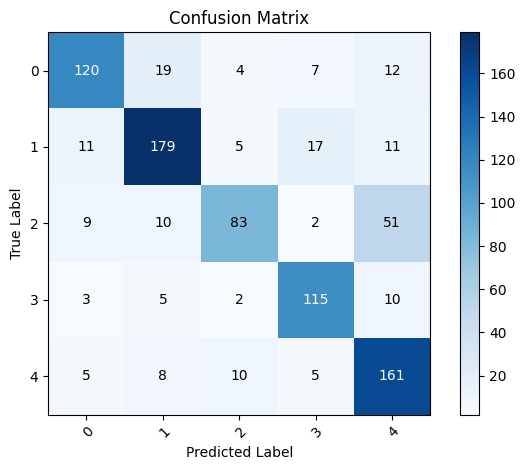

In [26]:
# Convert one-hot encoded labels to class indices
test_labels_indices = np.argmax(test_labels, axis=1)
predictions_indices = np.argmax(predictions, axis=1)

# Calculate the confusion matrix
cm = confusion_matrix(test_labels_indices, predictions_indices)

# Get class labels
classes = unique_labels(test_labels_indices, predictions_indices)

# Create a figure and axis
fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# Set axis labels
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=classes, yticklabels=classes,
       title='Confusion Matrix',
       ylabel='True Label',
       xlabel='Predicted Label')

# Rotate and align the tick labels
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over the data and create text annotations
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > cm.max() / 2 else "black")

# Display the plot
plt.tight_layout()
plt.show()


**Now let's print some images which were predicted `correctly`.**

In [27]:
import matplotlib.pyplot as plt

# Make predictions on the test set
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(test_labels, axis=1)

# Create lists to store the indices of images with the same and different labels
same_labels_indices = []
different_labels_indices = []

# Iterate through the predicted and true labels
for i in range(len(predicted_labels)):
    if predicted_labels[i] == true_labels[i]:
        same_labels_indices.append(i)
    else:
        different_labels_indices.append(i)


27/27 [==============================] - 15s 544ms/step


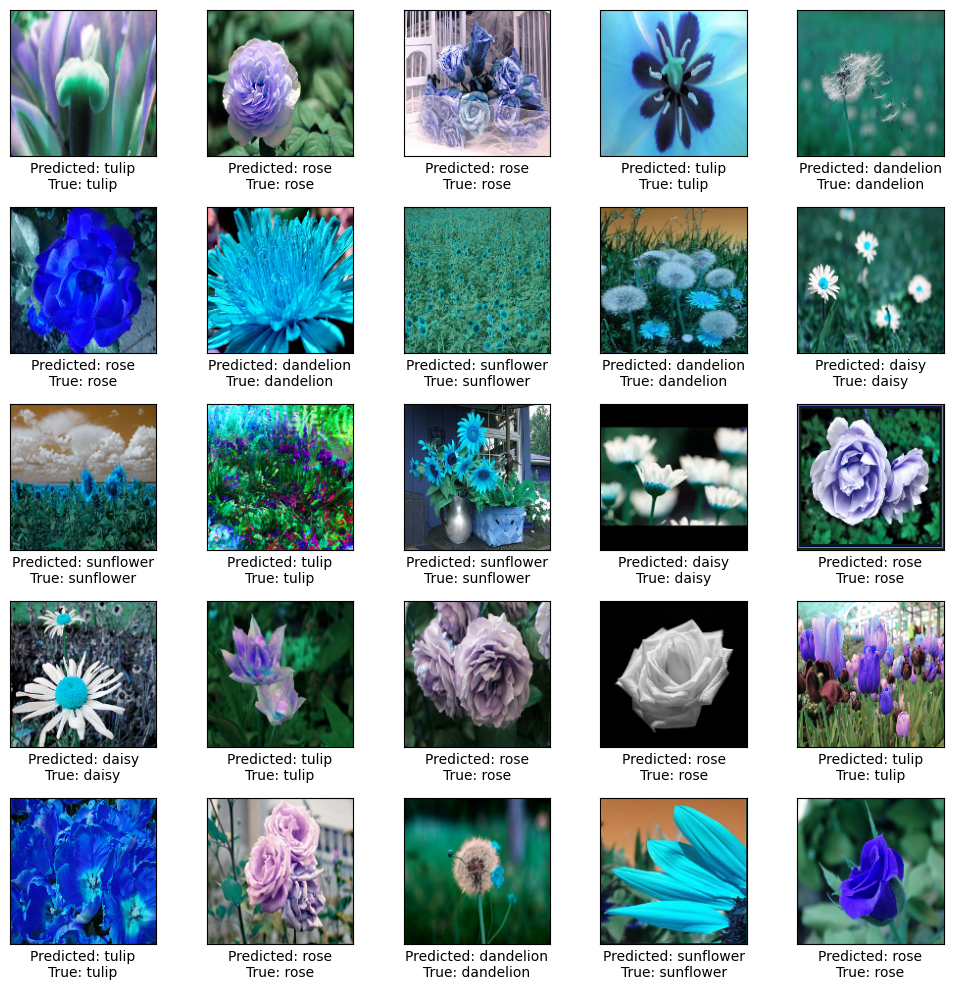

In [28]:
# Create a dictionary to map label indices to their corresponding names
index_to_label = {i: label for label, i in label_to_index.items()}

# Print images with the same predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(True)
    plt.imshow(test_images[same_labels_indices[i]], cmap=plt.cm.binary)
    predicted_label = index_to_label[predicted_labels[same_labels_indices[i]]]
    true_label = index_to_label[true_labels[same_labels_indices[i]]]
    plt.xlabel("Predicted: {}\nTrue: {}".format(predicted_label, true_label), wrap=True)
plt.tight_layout()
plt.show()


**And here we will predict images with `incorrect` predictions**

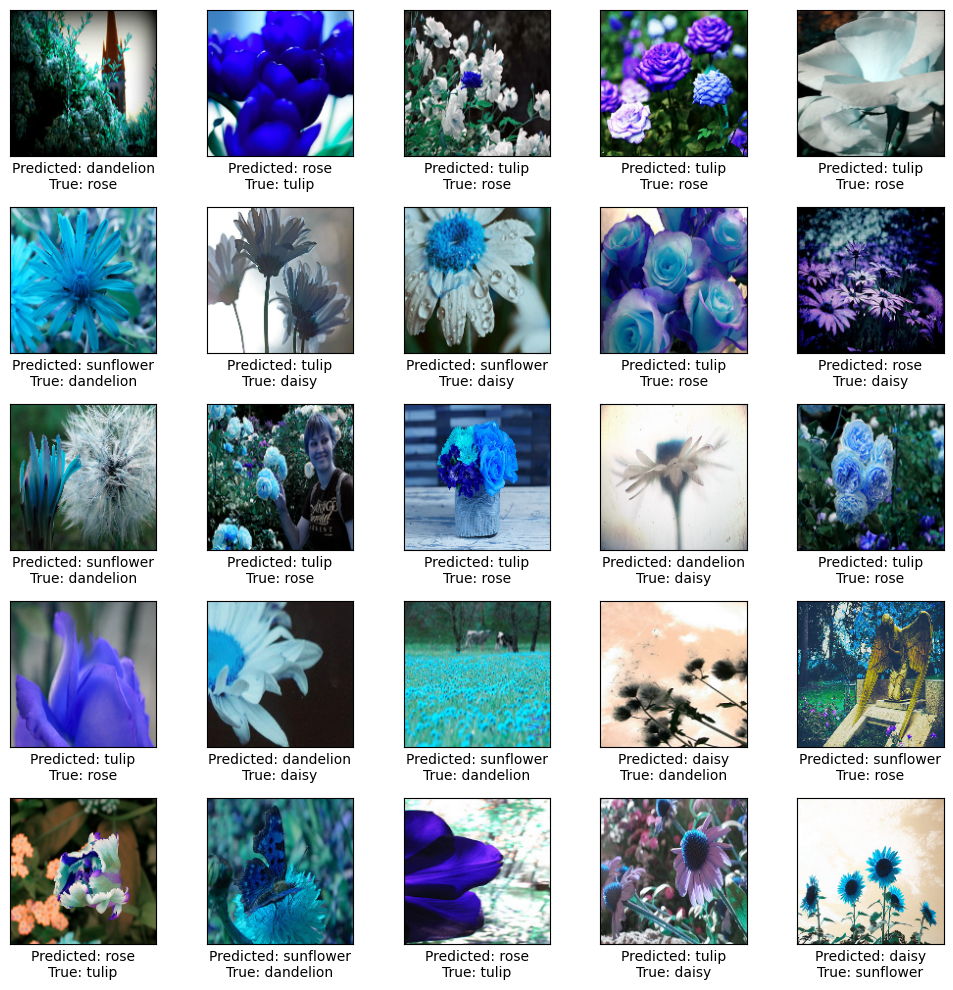

In [29]:
# Print images with different predicted and true labels
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[different_labels_indices[i]], cmap=plt.cm.binary)
    predicted_label = index_to_label[predicted_labels[different_labels_indices[i]]]
    true_label = index_to_label[true_labels[different_labels_indices[i]]]
    plt.xlabel("Predicted: {}\nTrue: {}".format(predicted_label, true_label), wrap=True)
plt.tight_layout()
plt.show()


# **Happy ending...**